In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib.cm as cmx
from mpl_toolkits.mplot3d import Axes3D
import matplotlib as mpl
from scipy.ndimage.filters import gaussian_filter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KDTree
from astropy.visualization import MinMaxInterval, LogStretch, ImageNormalize
from tqdm import tqdm
from numba import jit
import h5py
from astropy.cosmology import Planck18 as cosmo
from astropy.constants import c, G,  M_sun
from astropy import units as u

# Note
### Halo/Group refer to FoF group in the simulation, Subhalos are gravitationally bounds group of particles inside those halos found with Subfind

### keys 
    ['Config', 'Group', 'Header', 'IDs', 'Parameters', 'Subhalo']

### keys of Subhalo
    ['SubhaloBHMass', 'SubhaloBHMdot', 'SubhaloBfldDisk', 'SubhaloBfldHalo', 'SubhaloCM', 'SubhaloFlag', 'SubhaloGasMetalFractions', 'SubhaloGasMetalFractionsHalfRad', 'SubhaloGasMetalFractionsMaxRad', 'SubhaloGasMetalFractionsSfr', 'SubhaloGasMetalFractionsSfrWeighted', 'SubhaloGasMetallicity', 'SubhaloGasMetallicityHalfRad', 'SubhaloGasMetallicityMaxRad', 'SubhaloGasMetallicitySfr', 'SubhaloGasMetallicitySfrWeighted', 'SubhaloGrNr', 'SubhaloHalfmassRad', 'SubhaloHalfmassRadType', 'SubhaloIDMostbound', 'SubhaloLen', 'SubhaloLenType', 'SubhaloMass', 'SubhaloMassInHalfRad', 'SubhaloMassInHalfRadType', 'SubhaloMassInMaxRad', 'SubhaloMassInMaxRadType', 'SubhaloMassInRad', 'SubhaloMassInRadType', 'SubhaloMassType', 'SubhaloParent', 'SubhaloPos', 'SubhaloSFR', 'SubhaloSFRinHalfRad', 'SubhaloSFRinMaxRad', 'SubhaloSFRinRad', 'SubhaloSpin', 'SubhaloStarMetalFractions', 'SubhaloStarMetalFractionsHalfRad', 'SubhaloStarMetalFractionsMaxRad', 'SubhaloStarMetallicity', 'SubhaloStarMetallicityHalfRad', 'SubhaloStarMetallicityMaxRad', 'SubhaloStellarPhotometrics', 'SubhaloStellarPhotometricsMassInRad', 'SubhaloStellarPhotometricsRad', 'SubhaloVel', 'SubhaloVelDisp', 'SubhaloVmax', 'SubhaloVmaxRad', 'SubhaloWindMass']>
    
### keys of Group
    ['GroupBHMass', 'GroupBHMdot', 'GroupCM', 'GroupFirstSub', 'GroupGasMetalFractions', 'GroupGasMetallicity', 'GroupLen', 'GroupLenType', 'GroupMass', 'GroupMassType', 'GroupNsubs', 'GroupPos', 'GroupSFR', 'GroupStarMetalFractions', 'GroupStarMetallicity', 'GroupVel', 'GroupWindMass', 'Group_M_Crit200', 'Group_M_Crit500', 'Group_M_Mean200', 'Group_M_TopHat200', 'Group_R_Crit200', 'Group_R_Crit500', 'Group_R_Mean200', 'Group_R_TopHat200']

In [2]:
SIMUL = "TNG100-1"
# SIMUL = "TNG300-1"

# Global properties of the simulation

In [3]:
BOX_SIZE = 205.0 #TNG300-1
zd = 0.5
zs = 1.5
Ds = cosmo.angular_diameter_distance(zs)
Dd = cosmo.angular_diameter_distance(zd)
Dds = cosmo.angular_diameter_distance_z1z2(zd, zs)
sigma_crit = (c**2 * Ds / (4 * np.pi * G * Dd * Dds) / (1e10 * M_sun)).to(u.Mpc**(-2)).value
sigma_crit

226713.6059585938

# Field of view of cutouts: 20 arcsecond (for HorseShoe)

In [4]:
# figure out comobile physical scale 
h = cosmo.h
fov_arcsec = 20
fov = cosmo.angular_diameter_distance(zd) * (fov_arcsec / 3600 * np.pi / 180) / h
fov

<Quantity 0.18595909 Mpc>

In [5]:
# pixelscale for 512 cutouts
fov / 512

<Quantity 0.0003632 Mpc>

In [6]:
# fov of 612 pixel cutouts
fov + 100 * fov / 512

<Quantity 0.22227923 Mpc>

In [7]:
def fixed_boundary_coordinates(coords, centroid, box_size=BOX_SIZE):
    # account for the periodic box

    num_particles = coords.shape[0]

    new_coords = np.zeros(coords.shape)

    for i in range(3):
        CM_dist_0 = np.abs(coords[:, i] - centroid[i])
        CM_dist_1 = np.abs(coords[:, i] - np.ones(num_particles)*box_size - centroid[i])
        CM_dist_2 = np.abs(coords[:, i] + np.ones(num_particles)*box_size - centroid[i])
        # for each particle, we identify the coordinate closest to the center of mass, or center chosen
        particle_j = np.expand_dims(np.argmin(np.column_stack([CM_dist_0, CM_dist_1, CM_dist_2]), axis=1), axis=1)
        x_0 = coords[:, i] 
        x_1 = coords[:, i] - np.ones(num_particles)*box_size
        x_2 = coords[:, i] + np.ones(num_particles)*box_size
        new_coords[:, i] = np.take_along_axis(np.column_stack([x_0, x_1, x_2]), particle_j, axis=1)[:, 0]
    return new_coords


def gaussian_kernel_rasterize(coords, mass, center, fov, dims=[0, 1], pixels=512, n_neighbors=10, fw_param=2):
    """
    Rasterize particle cloud over the 2 dimensions, the output is a projected density
    """
    # Smooth particle mass over a region of size equal to the mean distance btw its n nearest neighbors in 3D
    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='kd_tree').fit(coords)
    distances, _ = nbrs.kneighbors(coords)
    distances = distances[:, 1:]  # the first column is 0 since the nearest neighbor of each point is the point itself, at a distance of zero.
    D = distances.mean(axis=1)  # characteristic distance used in kernel, correspond to FWHM of the kernel
    ell_hat = D / 2 / np.sqrt(2 * np.log(fw_param))

    # ell_hat = D * np.sqrt(103 / 1120)  is used by Rau, S., Vegetti, S., & White, S. D. M. (2013). MNRAS, 430(3), 2232–2248. https://doi.org/10.1093/mnras/stt043
    # this corresponds D=(FW at 2/3 maximum), so the kernel is very sharp. We use FWHM so the kernel are more large but this drowns better the particle noise

    # pixel grid encompass the full scene, but variable pixel size depending on the scene
    #     xmin = coord[:, dims[0]].min()
    #     xmax = coord[:, dims[0]].max()
    #     ymin = coord[:, dims[1]].min()
    #     ymax = coord[:, dims[1]].max()
    #     x = np.linspace(xmin, xmax, pixels)
    #     y = np.linspace(ymin, ymax, pixels)
    #     x, y = np.meshgrid(x, y)

    xmin = center[0] - fov / 2
    xmax = center[0] + fov / 2
    ymin = center[1] - fov / 2
    ymax = center[1] + fov / 2
    x = np.linspace(xmin, xmax, pixels)
    y = np.linspace(ymin, ymax, pixels)
    x, y = np.meshgrid(x, y)
    pixel_grid = np.stack([x, y], axis=-1)

    num_particle = coords.shape[0]
    Sigma = np.zeros(shape=pixel_grid.shape[:2], dtype=np.float32)
    for i in tqdm(range(num_particle)):
        xi = coords[i, dims][np.newaxis, np.newaxis, :] - pixel_grid  # pixel grade shape is [pix, pix, 2], coords is broadcasted along [pix, pix, :] to match last dim
        r_squared = xi[..., 0]**2 + xi[..., 1]**2
        Sigma += mass[i] * np.exp(-0.5 * r_squared / ell_hat[i] ** 2) / (2 * np.pi * ell_hat[i] ** 2)  # gaussian kernel
    return Sigma
    

In [8]:
if SIMUL == "TNG300-1":
    datapath = "/home/aadam/projects/rrg-lplevass/aadam/illustrisTNG300-1_snapshot99_groupcat"
elif SIMUL == "TNG100-1":
    datapath = "/home/aadam/projects/rrg-lplevass/aadam/illustrisTNG100-1_snapshot99_groupcat"

subhalo_positions = [] # interesting to plot the full simulation
subhalo_mass = []
subhalo_flag = []
subhalo_lentype = []
subhalo_cm = []
group_cm = []
group_lentype = []
group_mass = []
subhalo_group_number = []
for filename in os.listdir(datapath):
    with h5py.File(os.path.join(datapath, filename), "r") as f:
#         header = dict(f['Header'].attrs.items())
        try:
            group_cm.append(f["Group"]["GroupCM"][:])
            group_mass.append(f["Group"]["GroupMass"][:])
            group_lentype.append(f["Group"]["GroupLenType"][:])
#             subhalo_positions.append(f["Subhalo"]["SubhaloPos"][:]/1e3) # position of the particle with the minimum potential energy
            subhalo_mass.append(f["Subhalo"]["SubhaloMass"][:])
            subhalo_flag.append(f["Subhalo"]["SubhaloFlag"][:])
            subhalo_lentype.append(f["Subhalo"]["SubhaloLenType"][:])
#             subhalo_cm.append(f["Subhalo"]["SubhaloCM"][:]/1e3)
#             subhalo_group_number.append(f["Subhalo"]["SubhaloGrNr"][:])
        except KeyError:
            pass # its actually the bash files that introduce a problem here

select = np.concatenate(subhalo_flag) # select good subhalos only
# subhalo_positions = np.concatenate(subhalo_positions)
# x, y, z = [np.concatenate(subhalo_positions, axis=0)[select, i]/1e3 for i in range(3)] # convert to Mpc for conveniance
subhalo_mass = np.concatenate(subhalo_mass)
subhalo_lentype = np.concatenate(subhalo_lentype)
# id = np.concatenate(subhalo_group_number)[select]
group_mass = np.concatenate(group_mass)
# subhalo_cm = np.concatenate(subhalo_cm, axis=0)
# group_lentype = np.concatenate(group_lentype) # not usefull
group_cm = np.concatenate(group_cm, axis=0)

In [9]:
# get the cm of the 15k most massive group
ind = np.argpartition(group_mass, kth=-int(1.5e4))[-int(1.5e4):] # find 1.5e4 most massive groups
ind_2 = np.argsort(group_mass[ind])[::-1] # order the groups from most massive to least massive

In [10]:
group_cm_snap = group_cm[ind][ind_2]/1e3

In [11]:
large_halos = group_mass > 1e2 # 10^{12} solar mass
large_halos.sum()

1574

In [12]:
large_subhalos = (subhalo_mass > 1e2) & (select)
large_subhalos.sum()

1520

# Load the snapshot particles for a given halo

Note that halos and subhalos are ordered by mass, most massive one first and least lass. We are interested in the first 5 to 10 thousand halos 
in the simulation

In [13]:
# first we load the offset for our snapshot
if SIMUL == "TNG300-1":
    offsets_datapath = "/home/aadam/scratch/data/TNG300-1/offsets/offsets_099.hdf5"
elif SIMUL == "TNG100-1":
    offsets_datapath = "/home/aadam/scratch/data/TNG100-1/offsets/offsets_099.hdf5"

with h5py.File(offsets_datapath, "r") as f:
        offsets = f["FileOffsets"]["SnapByType"][:] # global particle number at the beginning of a chunk
        group_fileoffsets = f["FileOffsets"]["Group"][:] # global group id at the beginning of a chunk
        subhalo_fileoffsets = f["FileOffsets"]["Subhalo"][:]
        group_offsets = f["Group"]["SnapByType"][:] # global particle number at the beginning of a group
        subhalo_offsets = f["Subhalo"]["SnapByType"][:]
tot_chunks = offsets.shape[0]

In [14]:
offsets.shape

(448, 6)

### Halos are ordered by mass in the chunks

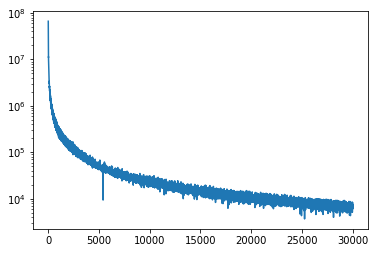

In [15]:
plt.plot(group_offsets[1:30000, 1] - group_offsets[:30000-1, 1])
plt.yscale("log")

### Subhalos are ordered by mass within an halo

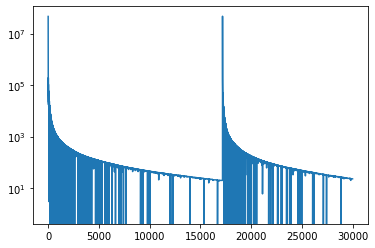

In [16]:
plt.plot(subhalo_offsets[1:30000, 1] - subhalo_offsets[:30000-1, 1])
plt.yscale("log")

In [17]:
if SIMUL == "TNG300-1":
    bad_subhalos = set([417716, 111936, 11747, 146889, 37491, 211745, 203919, 136962, 100237, 47314, 42630, 12630, 126392, 75825]) # found in post inspection of kappa maps
    subhalo_index = (subhalo_offsets[1:, 1] - subhalo_offsets[:-1, 1] > 5e4).nonzero()[0] # at least 10k particles for a mass of 10^{12} solar mass
    subhalo_index = np.array(list(set(subhalo_index).difference(bad_subhalos)))
elif SIMUL == "TNG100-1":
    dm_mass = 0.0005055742964369746 # in 10^{10} units
    min_dm_particles = 0.95e2 / dm_mass  # we take a smaller cutoof here since our mass estimate only include Dark matter
    subhalo_index = (subhalo_offsets[1:, 1] - subhalo_offsets[:-1, 1] > min_dm_particles).nonzero()[0] # at least 10k particles for a mass of 10^{12} solar mass
subhalo_index[:100]

array([     0,      1,      2,      3,      4,      5,      6,      7,
            8,      9,     12,     13,     15,  17184,  17185,  17186,
        17187,  17188,  17189,  17191,  31341,  31342,  31343,  31345,
        31347,  41581,  41582,  41583,  41584,  41585,  41586,  41587,
        41588,  52617,  52618,  52619,  52620,  52621,  52622,  52624,
        52625,  60730,  60731,  60732,  60733,  60734,  60735,  60736,
        60738,  60739,  60740,  60741,  60742,  69506,  69507,  69508,
        76086,  76087,  76088,  76089,  76090,  76091,  83279,  83280,
        83281,  88662,  88663,  88664,  88665,  88666,  88667,  88668,
        96499,  96500,  96501,  96502,  96503, 102682, 102683, 102684,
       108011, 108012, 108013, 108014, 108015, 108016, 108017, 114387,
       114388, 114389, 114390, 114391, 118678, 118679, 121863, 121864,
       125026, 125027, 125028, 125029])

In [18]:
np.save(f"../data/subhalo_{SIMUL}_id.npy", subhalo_index)
subhalo_index.size

1526

In [19]:
# Get FoF Groups (groups 0 to 9 are massive and interesting, otherwise check massive halo list)
halo_id = 3
part_type = 1 # dark matter
chunk = max(0, (group_offsets[halo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = group_offsets[halo_id, part_type] - offsets[chunk, part_type]
group_length = group_offsets[halo_id+1, part_type] - group_offsets[halo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(group_length, chunk_length - start)
remaining = group_length - length
dm_coord = []
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        dm_coord.append(f["PartType1"]["Coordinates"][start:start+length,:]/1e3)
        dm_mass = dict(f['Header'].attrs.items())["MassTable"][1]
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length
    
gas_mass = []
gas_coord = []
part_type = 0 # gas
chunk = max(0, (group_offsets[halo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = group_offsets[halo_id, part_type] - offsets[chunk, part_type]
group_length = group_offsets[halo_id+1, part_type] - group_offsets[halo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(group_length, chunk_length - start)
remaining = group_length - length
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        gas_coord.append(f["PartType0"]["CenterOfMass"][start:start+length, :]/1e3) # use center of mass instead of center of Voronoi Cell (Coordinate)
        gas_mass.append(f["PartType0"]["Masses"][start:start+length])
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length
    
bh_mass = []
bh_coord = []
part_type = 5 # BH
chunk = max(0, (group_offsets[halo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = group_offsets[halo_id, part_type] - offsets[chunk, part_type]
group_length = group_offsets[halo_id+1, part_type] - group_offsets[halo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(group_length, chunk_length - start)
remaining = group_length - length
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        bh_coord.append(f["PartType5"]["Coordinates"][start:start+length, :]/1e3) # use center of mass instead of center of Voronoi Cell (Coordinate)
        bh_mass.append(f["PartType5"]["Masses"][start:start+length])
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length
    
stars_mass = []
stars_coord = []
part_type = 4 # stars
chunk = max(0, (group_offsets[halo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = group_offsets[halo_id, part_type] - offsets[chunk, part_type]
group_length = group_offsets[halo_id+1, part_type] - group_offsets[halo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(group_length, chunk_length - start)
remaining = group_length - length
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        stars_coord.append(f["PartType4"]["Coordinates"][start:start+length, :]/1e3) # use center of mass instead of center of Voronoi Cell (Coordinate)
        stars_mass.append(f["PartType4"]["Masses"][start:start+length])
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length
        
        
dm_coord = np.concatenate(dm_coord)
gas_mass = np.concatenate(gas_mass)
gas_coord   = np.concatenate(gas_coord)
bh_coord = np.concatenate(bh_coord)
bh_mass = np.concatenate(bh_mass)
stars_coord = np.concatenate(stars_coord)
stars_mass = np.concatenate(stars_mass)

In [20]:
dm_mass

0.0005055742964369746

In [21]:
proj = [0, 1]
x = np.concatenate([dm_coord[:, proj[0]], gas_coord[:, proj[0]], stars_coord[:, proj[0]], bh_coord[:, proj[0]]])
y = np.concatenate([dm_coord[:, proj[1]], gas_coord[:, proj[1]], stars_coord[:, proj[1]], bh_coord[:, proj[1]]])
coords = np.concatenate([dm_coord, gas_coord, stars_coord, bh_coord], axis=0)
mass = np.concatenate([np.ones_like(dm_coord[:, 0]) * dm_mass, gas_mass, stars_mass, bh_mass])
# x = dm_coord[:, 0]
# y = dm_coord[:, 1]
# mass = np.ones_like(x) * dm_mass
fov = 1
n_neighbors = 10

### find a position where these might be a potential deflector

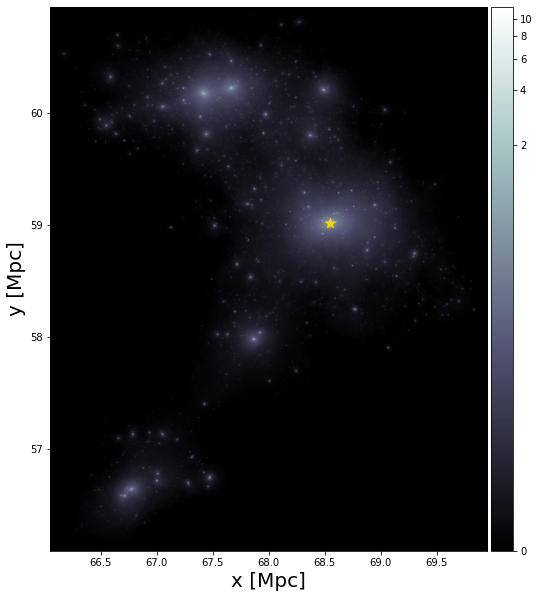

In [22]:
bins = 2048
heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins, range=[[x.min(), x.max()], [y.min(), y.max()]], weights=mass, density=False)
heatmap = heatmap.T  # transpose for imshow!
heatmap /= (fov / 512)**2
heatmap /= sigma_crit
cm_j, cm_i = np.unravel_index(np.argmax(heatmap), shape=heatmap.shape) # find the position of the peak, flip j and i here sice we transposed at previous step
cm_x = (xedges[cm_i] + xedges[cm_i+1])/2 
cm_y = (yedges[cm_j] + yedges[cm_j+1])/2
center = np.array([cm_x, cm_y])

extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = ax.imshow(heatmap, extent=extent, origin='lower', cmap=cmx.bone, norm=ImageNormalize(stretch=LogStretch()))
# plt.scatter(group_cm_snap[halo_id, 0], group_cm_snap[halo_id, 1], marker="*", s=100, color="red")
plt.scatter(cm_x, cm_y, marker="*", s=100, color="gold")
divider = make_axes_locatable(ax)
cax     = divider.append_axes("right", size="5%", pad=0.05) 
plt.colorbar(im,cax=cax)
ax.set_xlabel(r"x [Mpc]", fontsize=20)
ax.set_ylabel("y [Mpc]", fontsize=20);

### from this position, make a cutout and compute kappa map

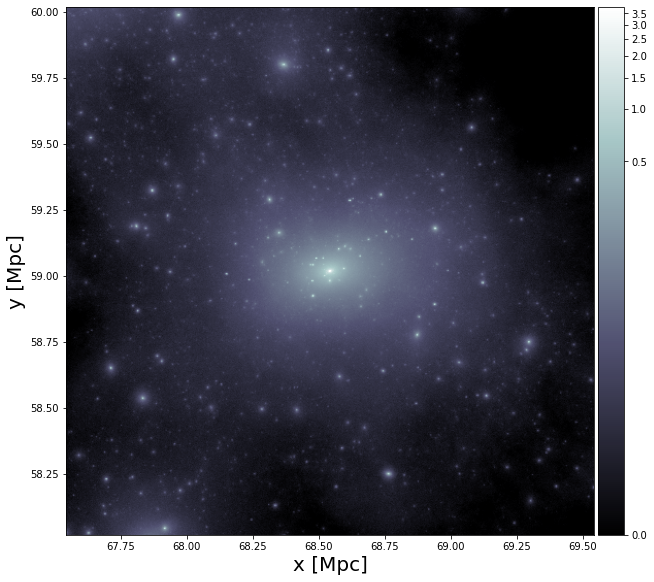

In [23]:
fov = 2
xmax = cm_x + fov/2
xmin = cm_x - fov/2
ymax = cm_y + fov/2
ymin = cm_y - fov/2
margin = 2 * fov / 512  # allow for particle near the margin to be counted in
select = (x < xmax) & (x > xmin) & (y < ymax) & (y > ymin)

# gaussian smoothed map
# center = np.array([cm_x, cm_y])
# heatmap = gaussian_kernel_rasterize(coords[select], mass[select], center, fov, dims=proj, pixels=512, n_neighbors=n_neighbors) # only good for dm
# heatmap /= sigma_crit

# first order estimate of the kappa map
heatmap, xedges, yedges = np.histogram2d(x[select], y[select], bins=512, range=[[xmin, xmax], [ymin, ymax]], weights=mass[select], density=False)
heatmap = heatmap.T
heatmap /= (fov / 512)**2
heatmap /= sigma_crit
extent = [center[0]-fov/2, center[0]+fov/2, center[1]-fov/2, center[1]+fov/2]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = ax.imshow(heatmap, extent=extent, origin='lower', cmap=cmx.bone, norm=ImageNormalize(stretch=LogStretch()))
# plt.scatter(group_cm_snap[halo_id, 0], group_cm_snap[halo_id, 1], marker="*", s=100, color="red")
# plt.scatter(cm_x, cm_y, marker="*", s=100, color="gold")
divider = make_axes_locatable(ax)
cax     = divider.append_axes("right", size="5%", pad=0.05) 
plt.colorbar(im,cax=cax)
ax.set_xlabel(r"x [Mpc]", fontsize=20)
ax.set_ylabel("y [Mpc]", fontsize=20);

### Thoughts
- From FoF group, it is going to be harder but interesting to extract kappa maps. There is much more structure
    - Might be useful to use Subfind subhalos to identify useful maps
    - Might use a peak finder algorithm to identify interesting maps -> peakfinder does not work for this

In [24]:
# Get FoF Groups (groups 0 to 3 are massive and interesting, otherwise check massive halo list)
subhalo_id = 468590#31#460401#9#417716#393217#17908 # most massive subhalo of halo 3

## load subhalo position
chunk = max(0, (subhalo_id > subhalo_fileoffsets).sum() - 1) # first chunk
subhalo_index = subhalo_id - subhalo_fileoffsets[chunk]
chunk_length = subhalo_fileoffsets[min(599, chunk+1)] - subhalo_fileoffsets[min(598, chunk)]
while subhalo_index >= chunk_length:
    chunk += 1
    subhalo_index -= chunk_length
    chunk_length = subhalo_fileoffsets[min(599, chunk+1)] - subhalo_fileoffsets[min(598, chunk)]
fof_datapath = f"/home/aadam/projects/rrg-lplevass/aadam/illustris{SIMUL}_snapshot99_groupcat/fof_subhalo_tab_099.{chunk}.hdf5"
with h5py.File(fof_datapath, "r") as f:
    subhalo_position = f["Subhalo"]["SubhaloCM"][subhalo_index]/1e3
        
######## should put into a cleaner function this part
part_type = 1 # dark matter
chunk = max(0, (subhalo_offsets[subhalo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = subhalo_offsets[subhalo_id, part_type] - offsets[chunk, part_type]
subhalo_length = subhalo_offsets[subhalo_id+1, part_type] - subhalo_offsets[subhalo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(subhalo_length, chunk_length - start)
remaining = subhalo_length - length
dm_coord = []
# dm_potential = []
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        dm_mass = dict(f['Header'].attrs.items())["MassTable"][1]
        dm_coord.append(f["PartType1"]["Coordinates"][start:start+length,:]/1e3)
#         dm_potential.append(f["PartType1"]["Potential"][start:start+length])
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length

gas_mass = []
gas_coord = []
part_type = 0 # gas
chunk = max(0, (subhalo_offsets[subhalo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = subhalo_offsets[subhalo_id, part_type] - offsets[chunk, part_type]
subhalo_length = subhalo_offsets[subhalo_id+1, part_type] - subhalo_offsets[subhalo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(subhalo_length, chunk_length - start)
remaining = subhalo_length - length
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        gas_coord.append(f["PartType0"]["CenterOfMass"][start:start+length, :]/1e3) # use center of mass instead of center of Voronoi Cell (Coordinate)
        gas_mass.append(f["PartType0"]["Masses"][start:start+length])
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length
    
bh_mass = []
bh_coord = []
part_type = 5 # BH
chunk = max(0, (subhalo_offsets[subhalo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = subhalo_offsets[subhalo_id, part_type] - offsets[chunk, part_type]
subhalo_length = subhalo_offsets[subhalo_id+1, part_type] - subhalo_offsets[subhalo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(subhalo_length, chunk_length - start)
remaining = subhalo_length - length
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        bh_coord.append(f["PartType5"]["Coordinates"][start:start+length, :]/1e3) # use center of mass instead of center of Voronoi Cell (Coordinate)
        bh_mass.append(f["PartType5"]["Masses"][start:start+length])
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length
    
stars_mass = []
stars_coord = []
part_type = 4 # stars
chunk = max(0, (subhalo_offsets[subhalo_id, part_type] > offsets[:, part_type]).sum() - 1) # first chunk
start = subhalo_offsets[subhalo_id, part_type] - offsets[chunk, part_type]
subhalo_length = subhalo_offsets[subhalo_id+1, part_type] - subhalo_offsets[subhalo_id, part_type]
chunk_length = offsets[min(tot_chunks-1, chunk+1), part_type] - offsets[min(tot_chunks-2, chunk), part_type]
length = min(subhalo_length, chunk_length - start)
remaining = subhalo_length - length
i = 0
while length > 0:
    snapshot_datapath = f"/home/aadam/scratch/data/{SIMUL}/snapshot99/snap_099.{chunk + i}.hdf5"
    with h5py.File(snapshot_datapath, "r") as f:
        stars_coord.append(f["PartType4"]["Coordinates"][start:start+length, :]/1e3) # use center of mass instead of center of Voronoi Cell (Coordinate)
        stars_mass.append(f["PartType4"]["Masses"][start:start+length])
    i += 1
    start = 0
    chunk_length = offsets[min(599, chunk+1+i), part_type] - offsets[min(598, chunk+i), part_type]
    length = min(remaining, chunk_length)
    remaining -= length
        
        
dm_coord = np.concatenate(dm_coord) # each dm particla has a mass of 10^{8} solar mass
stars_coord = np.concatenate(stars_coord)
stars_mass = np.concatenate(stars_mass)
gas_coord   = np.concatenate(gas_coord)
gas_mass = np.concatenate(gas_mass) # 10^{10} solar mass
bh_coord = np.concatenate(bh_coord)
bh_mass = np.concatenate(bh_mass)

In [37]:
# show = "dm+stars"
show = "stars"
bins = 1024
proj = [0, 1]
fov = 0.1
n_neighbors = 64
fw_param = 3
smooth_scale = 0.001 # if first order is used

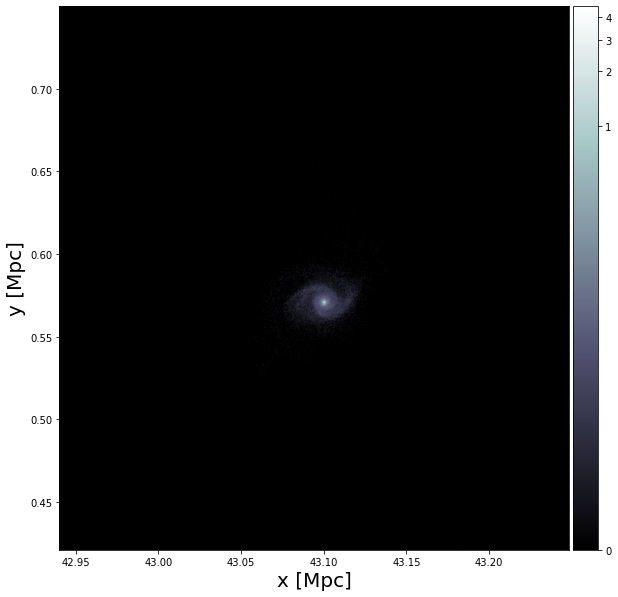

In [38]:
if show == "all":
    coords = np.concatenate([dm_coord, gas_coord, stars_coord], axis=0)
    coords = fixed_boundary_coordinates(coords, subhalo_position, box_size=BOX_SIZE)
    weights = np.concatenate([np.ones_like(dm_coord[:, 0]) * dm_mass, gas_mass, stars_mass])
    x = coords[:, proj[0]]
    y = coords[:, proj[1]]
elif show == "dm+stars":
    coords = np.concatenate([dm_coord, stars_coord], axis=0)
    coords = fixed_boundary_coordinates(coords, subhalo_position, box_size=BOX_SIZE)
    weights = np.concatenate([np.ones_like(dm_coord[:, 0]) * dm_mass, stars_mass])
    x = coords[:, proj[0]]
    y = coords[:, proj[1]]
elif show == "gas":
    coords = gas_coord
    coords = fixed_boundary_coordinates(coords, subhalo_position, box_size=BOX_SIZE)
    x = coords[:, proj[0]]
    y = coords[:, proj[1]]
    weights = gas_mass
elif show == "dm":
    coords = dm_coord
    coords = fixed_boundary_coordinates(coords, subhalo_position, box_size=BOX_SIZE)
    x = coords[:, proj[0]]
    y = coords[:, proj[1]]
    weights = np.ones_like(x) * dm_mass
elif show == "bh":
    coords = bh_coord
    coords = fixed_boundary_coordinates(coords, subhalo_position, box_size=BOX_SIZE)
    x = coords[:, proj[0]]
    y = coords[:, proj[1]]
    weights = bh_mass
elif show == "stars":
    coords = stars_coord
    coords = fixed_boundary_coordinates(coords, subhalo_position, box_size=BOX_SIZE)
    x = coords[:, proj[0]]
    y = coords[:, proj[1]]
    weights = stars_mass


heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins, range=[[x.min(), x.max()], [y.min(), y.max()]], weights=weights, density=False) # global view of the subhalo
heatmap = heatmap.T # always transpose the result after histogram!!!
heatmap /= ((x.max() - x.min()) / bins) * ((y.max() - y.min()) / bins)
heatmap /= sigma_crit
# heatmap = gaussian_filter(heatmap, sigma = bins / np.mean([x.max() - x.min(), y.max() - y.min()]) * smooth_scale)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

# we might not need this after all, since subhalo_position is good -> problem was introduced by this transpoition issue
cm_j, cm_i = np.unravel_index(np.argmax(heatmap), shape=heatmap.shape)
cm_x = (xedges[cm_i] + xedges[cm_i+1])/2 # find the position of the peak
cm_y = (yedges[cm_j] + yedges[cm_j+1])/2

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = ax.imshow(heatmap, extent=extent, origin='lower', cmap=cmx.bone, norm=ImageNormalize(stretch=LogStretch()))
# plt.scatter(cm_x, cm_y, marker="*", s=100, color="gold")
# plt.scatter(subhalo_position[proj[0]], subhalo_position[proj[1]], marker="*", s=100, color="red")
divider = make_axes_locatable(ax)
cax     = divider.append_axes("right", size="5%", pad=0.05) 
plt.colorbar(im,cax=cax)
ax.set_xlabel(r"x [Mpc]", fontsize=20)
ax.set_ylabel("y [Mpc]", fontsize=20);

62934
63310


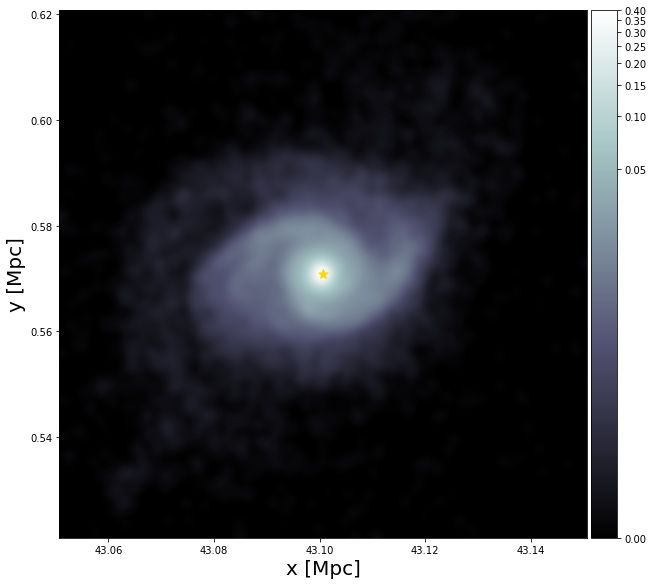

In [39]:
xmax = cm_x + fov/2
xmin = cm_x - fov/2
ymax = cm_y + fov/2
ymin = cm_y - fov/2
margin = 2 * fov / 512  # allow for particle near the margin to be counted in
select = (x < xmax + margin) & (x > xmin - margin) & (y < ymax + margin) & (y > ymin - margin)
center = np.array([cm_x, cm_y])
print(select.sum())
print(select.size)
# gaussian smoothed map
# heatmap = gaussian_kernel_rasterize(coords[select], 
#                                     weights[select], center, fov, 
#                                     dims=proj, pixels=512, 
#                                     n_neighbors=n_neighbors, fw_param=fw_param) # only good for dm
heatmap /= sigma_crit

# first order estimate of the kappa map
heatmap, xedges, yedges = np.histogram2d(x[select], y[select], bins=512, range=[[xmin, xmax], [ymin, ymax]], weights=weights[select], density=False)
heatmap = heatmap.T # always transpose the result after histogram!!!
heatmap /= (fov / 512)**2
heatmap /= sigma_crit
heatmap = gaussian_filter(heatmap, sigma=512 / fov * smooth_scale)

extent = [center[0]-fov/2, center[0]+fov/2, center[1]-fov/2, center[1]+fov/2]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = ax.imshow(heatmap, extent=extent, origin='lower', cmap=cmx.bone, norm=ImageNormalize(stretch=LogStretch()))
plt.scatter(cm_x, cm_y, marker="*", s=100, color="gold")
# plt.scatter(subhalo_position[proj[0]], subhalo_position[proj[1]], marker="*", s=100, color="red")
divider = make_axes_locatable(ax)
cax     = divider.append_axes("right", size="5%", pad=0.05) 
plt.colorbar(im,cax=cax)
ax.set_xlabel(r"x [Mpc]", fontsize=20)
ax.set_ylabel("y [Mpc]", fontsize=20);

<ipython-input-40-f9a6bedfca35>:7: UserWarning: No contour levels were found within the data range.
  ax.contour(heatmap, levels=[0.5, 1, 2], extent=extent, cmap="hot_r")


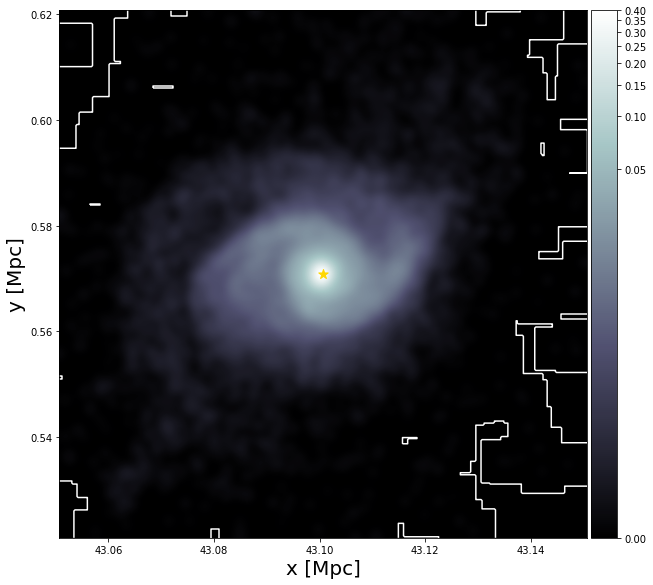

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
im = ax.imshow(heatmap, extent=extent, origin='lower', cmap=cmx.bone, norm=ImageNormalize(stretch=LogStretch()))
plt.scatter(cm_x, cm_y, marker="*", s=100, color="gold")
divider = make_axes_locatable(ax)
cax     = divider.append_axes("right", size="5%", pad=0.05) 
plt.colorbar(im,cax=cax)
ax.contour(heatmap, levels=[0.5, 1, 2], extent=extent, cmap="hot_r")
ax.set_xlabel(r"x [Mpc]", fontsize=20)
ax.set_ylabel("y [Mpc]", fontsize=20);
# plt.title("")

## Plot the entire projected snapshot

In [247]:
datapath = "/home/aadam/projects/rrg-lplevass/aadam/illustrisTNG300-1_snapshot99_groupcat"
subhalo_positions = []
subhalo_mass = []
subhalo_flag = []
for filename in os.listdir(datapath):
    with h5py.File(os.path.join(datapath, filename), "r") as f:
        try:
            subhalo_positions.append(f["Subhalo"]["SubhaloPos"][:]) # position of the particle with the minimum potential energy
            subhalo_mass.append(f["Subhalo"]["SubhaloMass"][:])
            subhalo_flag.append(f["Subhalo"]["SubhaloFlag"][:])
        except KeyError:
            pass # its actually the bash files that introduce a problem here

select = np.concatenate(subhalo_flag) # select good subhalos only
x, y, z = [np.concatenate(subhalo_positions, axis=0)[select, i]/1e3 for i in range(3)] # convert to Mpc for conveniance
subhalo_mass = np.concatenate(subhalo_mass)
m = subhalo_mass[select]

In [248]:
bins = 4000
smooth_scale = 0.5 # pixel scale

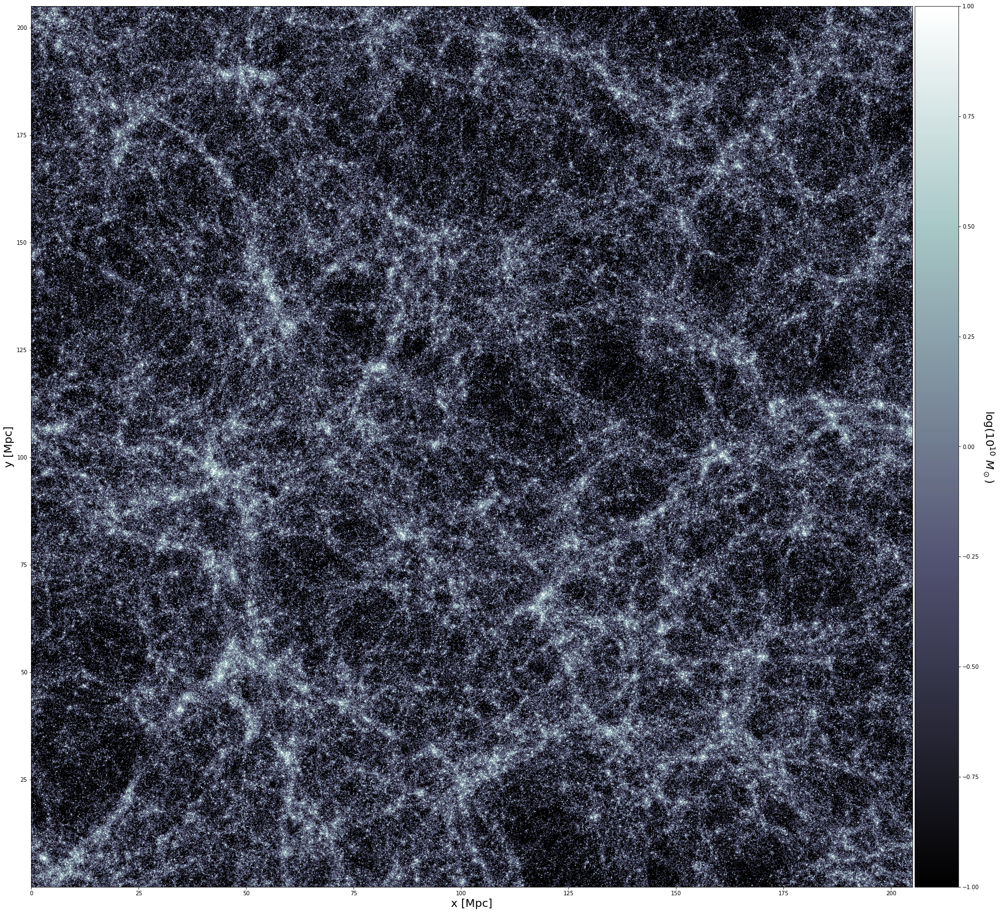

In [249]:
heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins, range=[[x.min(), x.max()], [y.min(), y.max()]], weights=m, density=False)
heatmap = heatmap.T
heatmap = gaussian_filter(heatmap, sigma=smooth_scale)

extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
fig, ax = plt.subplots(1, 1, figsize=(30, 30))
im = ax.imshow(np.log10(heatmap + 1e-6), extent=extent, origin='lower', cmap=cmx.bone, vmax=1., vmin=-1.)
divider = make_axes_locatable(ax)
cax     = divider.append_axes("right", size="5%", pad=0.05) 
plt.colorbar(im,cax=cax)
cax.set_ylabel(r"$\log(10^{10}$ $M_\odot)$", rotation=-90, labelpad=30, fontsize=20)
ax.set_xlabel(r"x [Mpc]", fontsize=20)
ax.set_ylabel("y [Mpc]", fontsize=20);